<a href="https://colab.research.google.com/github/Lamiou/PlantsReco/blob/main/PlantsReco.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [122]:
!pip install -Uqq fastbook
!pip install scikit-image

In [124]:
import os
import pandas as pd 
import matplotlib.pyplot as plt

import fastbook
fastbook.setup_book()

**Partie 1 : Préparation de données**

**Diagramme des répartitions des données**

<BarContainer object of 5 artists>

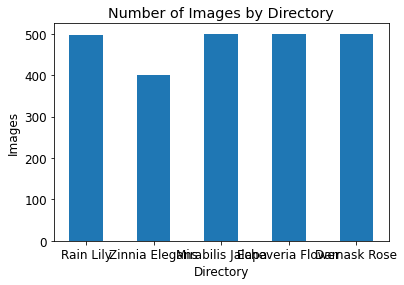

In [95]:
number_classes = {'Rain Lily': len(os.listdir('gdrive/MyDrive/archive/Ornamental_Plants/train/Rain_Lily')),
                  'Zinnia Elegans': len(os.listdir('gdrive/MyDrive/archive/Ornamental_Plants/train/Zinnia_Elegans')),
                  'Mirabilis Jalapa': len(os.listdir('gdrive/MyDrive/archive/Ornamental_Plants/train/Mirabilis_Jalapa')),
                  'Echeveria Flower': len(os.listdir('gdrive/MyDrive/archive/Ornamental_Plants/train/Echeveria_Flower')),
                  'Damask Rose': len(os.listdir('gdrive/MyDrive/archive/Ornamental_Plants/train/Damask_Rose'))}

plt.title("Number of Images by Directory")
plt.xlabel('Directory')
plt.ylabel('Images')
plt.bar(number_classes.keys(), number_classes.values(), width = .5)

([<matplotlib.patches.Wedge at 0x7f8c60639210>,
 [Text(-0.6678259001181354, 0.8740758360299195, 'Rain Lily'),
  Text(-1.0635678799540933, -0.28075499056999104, 'Zinnia Elegans'),
  Text(-0.14655490135738697, -1.0901934052672153, 'Mirabilis Jalapa'),
  Text(1.0155767619413687, -0.4226154760591294, 'Echeveria Flower'),
  Text(0.6701138512236727, 0.8723230057714731, 'Damask Rose')],
 [Text(-0.36426867279171016, 0.4767686378345014, '20.77%'),
  Text(-0.5801279345204144, -0.15313908576544966, '16.68%'),
  Text(-0.07993903710402925, -0.5946509483275719, '20.85%'),
  Text(0.5539509610589284, -0.23051753239588874, '20.85%'),
  Text(0.36551664612200324, 0.4758125486026217, '20.85%')])

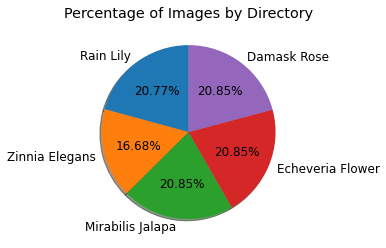

In [96]:
plt.title("Percentage of Images by Directory")
plt.pie(number_classes.values(),labels =number_classes.keys(),startangle=90, shadow = True,  autopct='%.2f%%')

Dans les diagrammes ci-dessus nous pouvons observer nombre d'images par dossier nous pouvons observer que la pluspart des dossier on le même nombre d'image ce qui auras pour impacte d'avoir un accuracy pratiquement identique. Mais nous pouvons observé également qu'un des sous dossier a un peu nombre d'images afin d'augmenter celui-ci il faudras donc faire une augmentation images.

**AUGMENTATION DES IMAGES**

Rotation de l'image aléatoirement.

In [101]:
def random_rotation(image_array):
    random_degree = random.uniform(-25, 25)
    return sk.transform.rotate(image_array, random_degree)

Ajout de bruit aléatoire a l'image

In [102]:
def random_noise(image_array):
    return sk.util.random_noise(image_array)

Symétrie de l'image

In [103]:
def horizontal_flip(image_array):
    return image_array[:, ::-1]

In [118]:
dirAugmentation = 'gdrive/MyDrive/archive/Ornamental_Plants/train/Zinnia_Elegans'
numImageGeneratedDesired = 100
images = [os.path.join(dirAugmentation, f) for f in os.listdir(dirAugmentation) if os.path.isfile(os.path.join(dirAugmentation, f))]
numImagesGenerated = 0
while numImagesGenerated <= numImageGeneratedDesired :
    # random image from the folder
    imagePath = random.choice(images)
    # read image as an two dimensional array of pixels
    imageToTransform = sk.io.imread(image_path)

AttributeError: ignored

**Rename des images**


In [91]:
directory = 'gdrive/MyDrive/archive/Ornamental_Plants/train/'

nameFolder = os.listdir(directory) # Recupération des noms des sous-dossiers dans le dossier tests

for names in nameFolder :
  for count, filename in enumerate(os.listdir(f'{directory}{names}')):
    newName = f"{names}_{str(count)}.jpg" # nouveau nom du fichier
    src = f"{directory}{names}/{filename}" # source du fichier
    dst = f"{directory}{names}/{newName}" # destination 

    os.rename(src,dst) # Méthode rename pour renomé les images 

Verification si le nom des images a bien été changer

In [129]:
for names in nameFolder :
  print(names)
  for filename in os.listdir(f'{directory}{names}'):
    print(filename)


Zinnia_Elegans
Zinnia_Elegans_0.jpg
Zinnia_Elegans_1.jpg
Zinnia_Elegans_2.jpg
Zinnia_Elegans_3.jpg
Zinnia_Elegans_4.jpg
Zinnia_Elegans_5.jpg
Zinnia_Elegans_6.jpg
Zinnia_Elegans_7.jpg
Zinnia_Elegans_8.jpg
Zinnia_Elegans_9.jpg
Zinnia_Elegans_10.jpg
Zinnia_Elegans_11.jpg
Zinnia_Elegans_12.jpg
Zinnia_Elegans_13.jpg
Zinnia_Elegans_14.jpg
Zinnia_Elegans_15.jpg
Zinnia_Elegans_16.jpg
Zinnia_Elegans_17.jpg
Zinnia_Elegans_18.jpg
Zinnia_Elegans_19.jpg
Zinnia_Elegans_20.jpg
Zinnia_Elegans_21.jpg
Zinnia_Elegans_22.jpg
Zinnia_Elegans_23.jpg
Zinnia_Elegans_24.jpg
Zinnia_Elegans_25.jpg
Zinnia_Elegans_26.jpg
Zinnia_Elegans_27.jpg
Zinnia_Elegans_28.jpg
Zinnia_Elegans_29.jpg
Zinnia_Elegans_30.jpg
Zinnia_Elegans_31.jpg
Zinnia_Elegans_32.jpg
Zinnia_Elegans_33.jpg
Zinnia_Elegans_34.jpg
Zinnia_Elegans_35.jpg
Zinnia_Elegans_36.jpg
Zinnia_Elegans_37.jpg
Zinnia_Elegans_38.jpg
Zinnia_Elegans_39.jpg
Zinnia_Elegans_40.jpg
Zinnia_Elegans_41.jpg
Zinnia_Elegans_42.jpg
Zinnia_Elegans_43.jpg
Zinnia_Elegans_44.jpg
Zinni

**Partie 2 : Model Building**

In [203]:
#id first_training
#caption Results from the first training
# CLICK ME
from fastai.vision.all import *
path = 'gdrive/MyDrive/archive/Ornamental_Plants/train/'

def isTypeFlower(x): return x[0].isupper()
dls = ImageDataLoaders.from_folder(
    path, get_image_files(path), valid_pct=0.2, seed=42,
    label_func=isTypeFlower, item_tfms=Resize(224))

learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(7)

epoch,train_loss,valid_loss,error_rate,time


KeyboardInterrupt: ignored

In [201]:
uploader = SimpleNamespace(data = ['gdrive/MyDrive/index.jpg'])

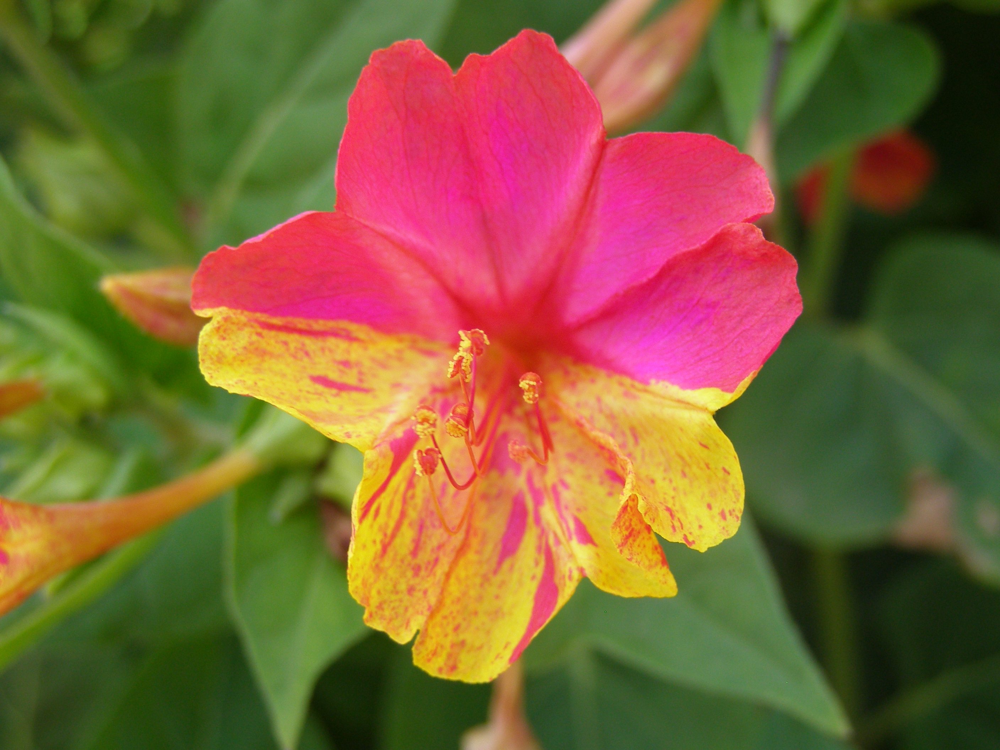

In [198]:
img

In [202]:
img = PILImage.create(uploader.data[0])
isTypeFlower,_,probs = learn.predict(img)
print(f"Whats type of flower is ?: {isTypeFlower}.")
print(f"Probability it's a {isTypeFlower}: {probs[0].item():.6f}")

Whats type of flower is ?: Mirabilis_Jalapa.
Probability it's a Mirabilis_Jalapa: 0.007295
